# Neopixel Ring Workshop MicroPython

## Wiring the Circuit

### Materials

- Raspberry Pi Pico 
- Breadboard(s)
- 3 Buttons
- Male-Male connectors
- 3 AA batteries
- 3 AA battery holders
- Neopixel Ring
- Multimeter

### Instructions

<div>
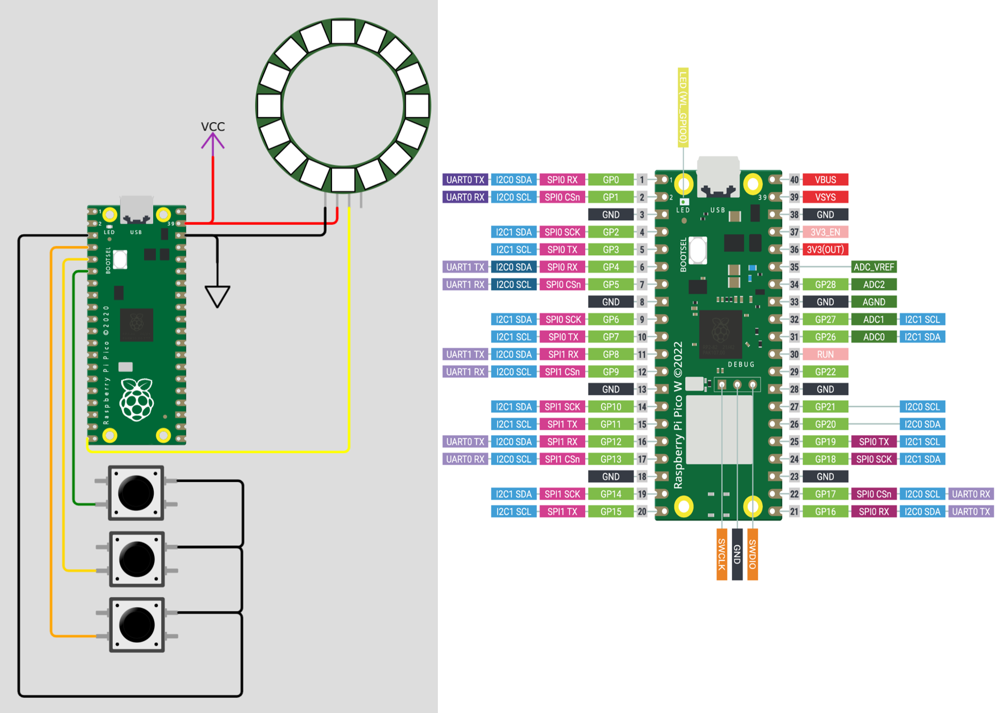
</div>

- Place the RPi Pico on the bradboard 
- Connect the first GND pin (3) to one of the holes in the negative strip on the bradboarad to ground the entire strip

###### Buttons
- Insert the buttons into the breadboard
- Ground each button by connecting one pin to the negative strip on the bradboard that you grounded using the RPi Pico
- For each button, connect the lead diagnal to the lead you grounded to one of the I/O pins on the RPi Pico 
    - This project uses I/O pins 2,3, 4 (which corrspond to the fourth, fifth, and sixth positions on the RPi Pico)

###### Neopixel Ring
- Ground the ring by connecting the ground to any GND pin on the RPi Pico
- Connect V+ on the ring to VSYS pin (this is thirty-ninth position on the RPi Pico) 
- Connect Data Input (IN) to an I/O pin on the RPi Pico 
    - This project uses I/O pin 15 (which corrspond to the twentieth position on the RPi Pico)
    
###### Battery Power
** Do not connect battery power source while board is connected to USB **
- Batteries should be connected in series 
    - Use a wire to connect the '+' end of one battery to the '-' end of the next
- Use a multimeter to identify the direction of current flow
    - This just means you use the voltmeter to measure the voltage by connecting the test leads to each end of your wired battery pack. 
    - The voltage should read somewhere around 4.5 volts (1.5 Volt batter *3). 
        - If the voltage reads negative, the black test lead is touching the + side of the battery pack and the red test lead is touching the - side of the battery pack
        - If the voltage is positive, the black test lead is touching the - side of the battery pack and the red test lead is touching the + side of the battery pack
        - connect the appropriate color wires to each end of the battery pack (red for +, and black for -)


###### V1 Images: Breadboard

<div>
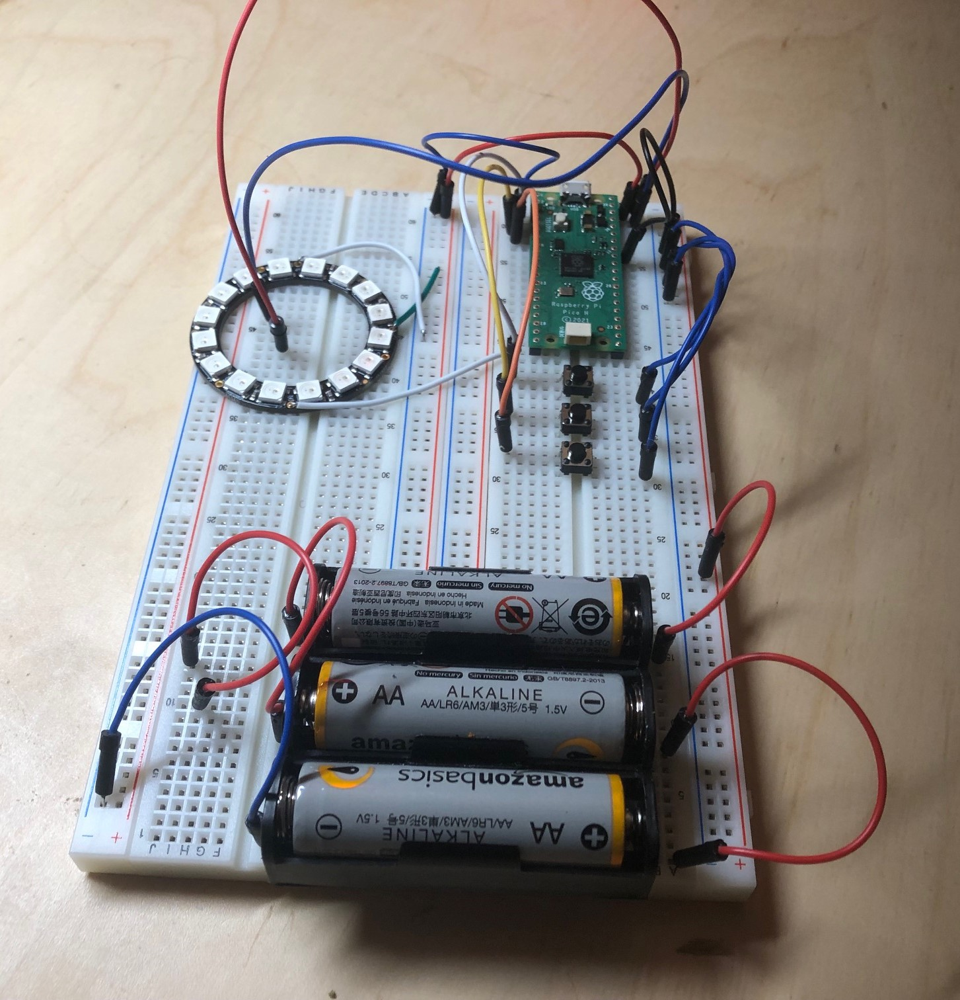
</div>

###### V2 Images: Soldered Prototype

<table><tr>
<td> 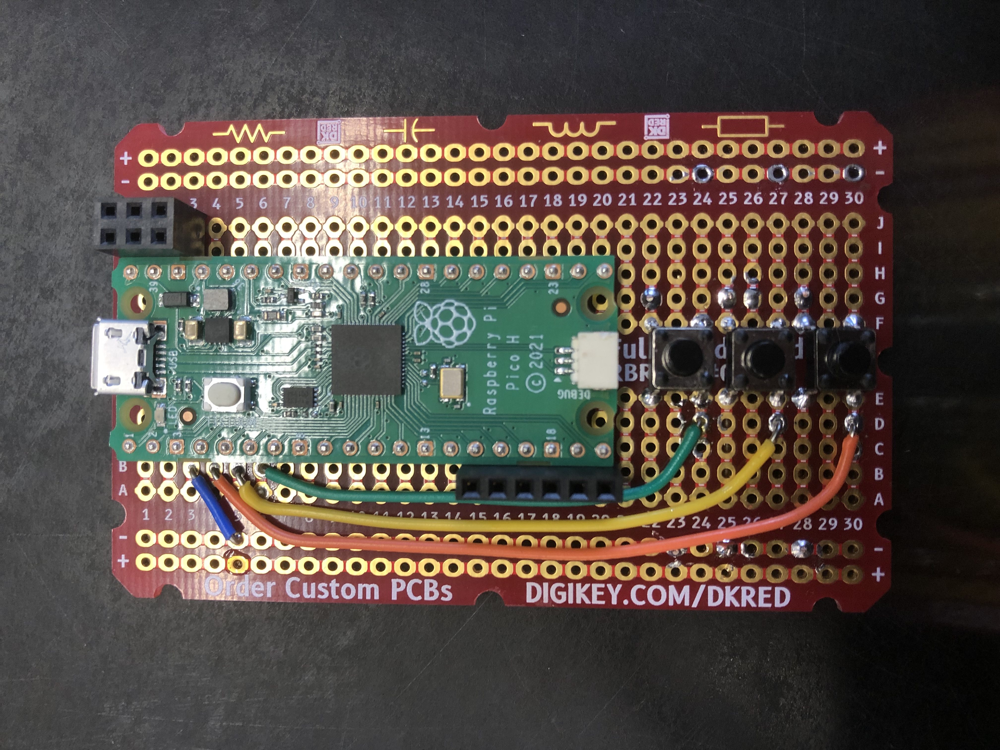 </td>
<td> 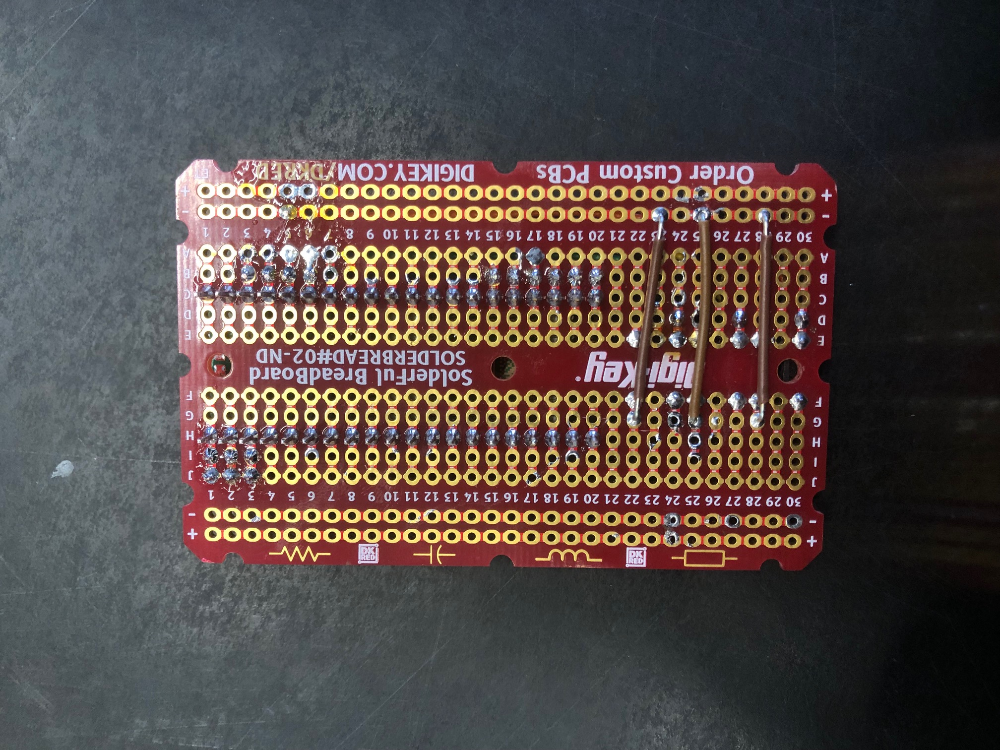 </td>
</tr></table>

<table><tr>
<td> 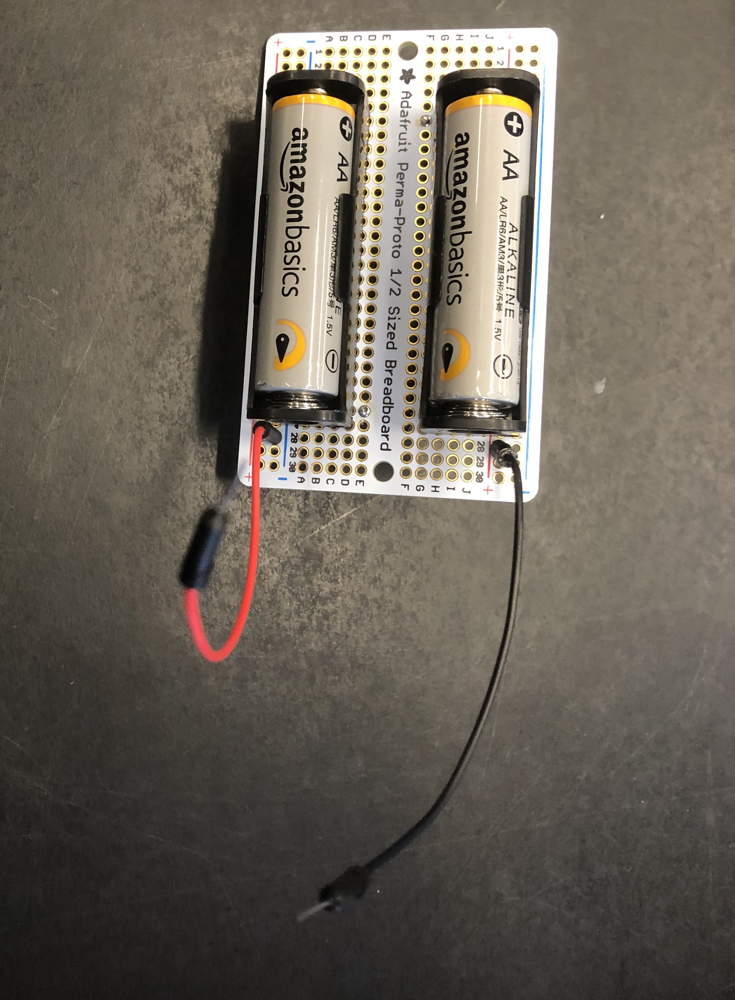 </td>
<td> 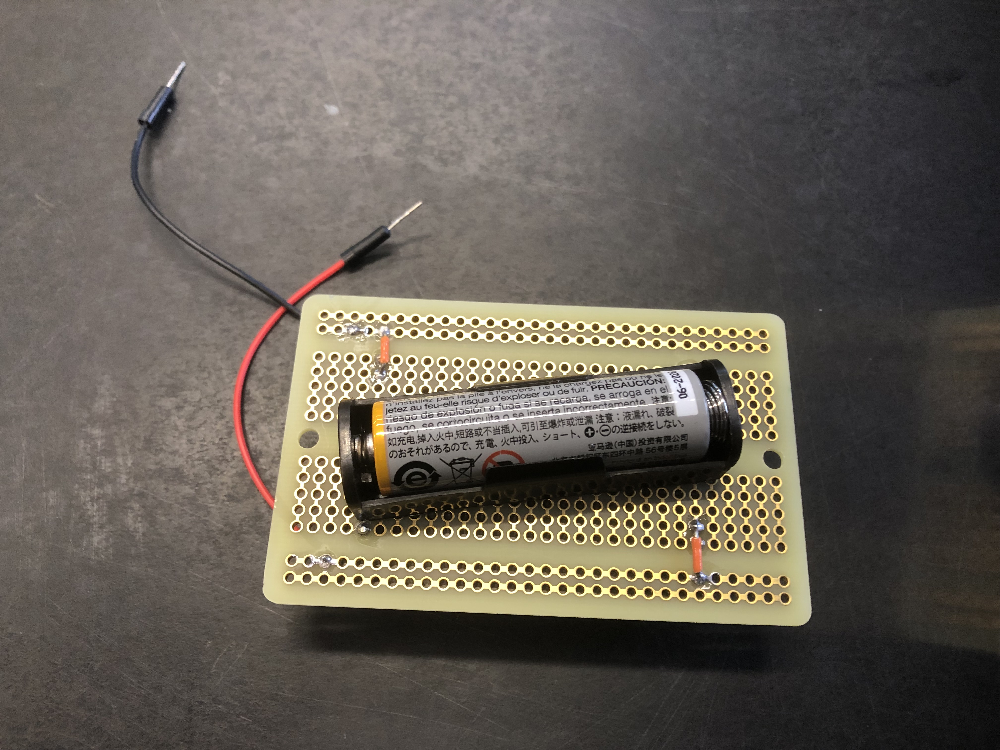 </td>
</tr></table>

<table><tr>
<td> 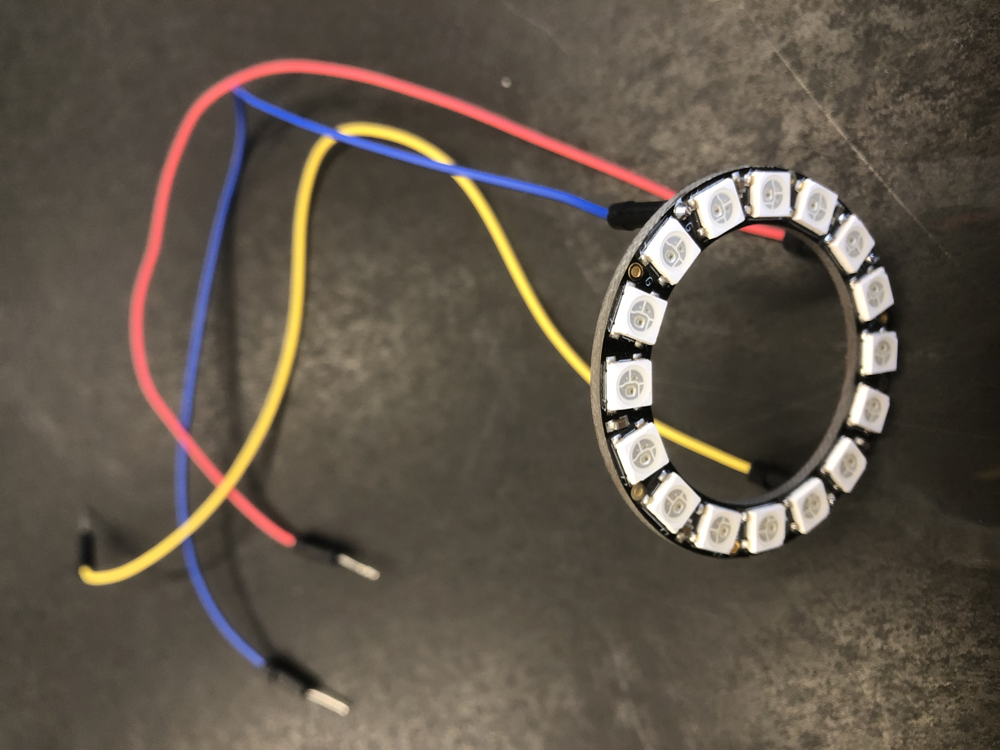 </td>
<td> 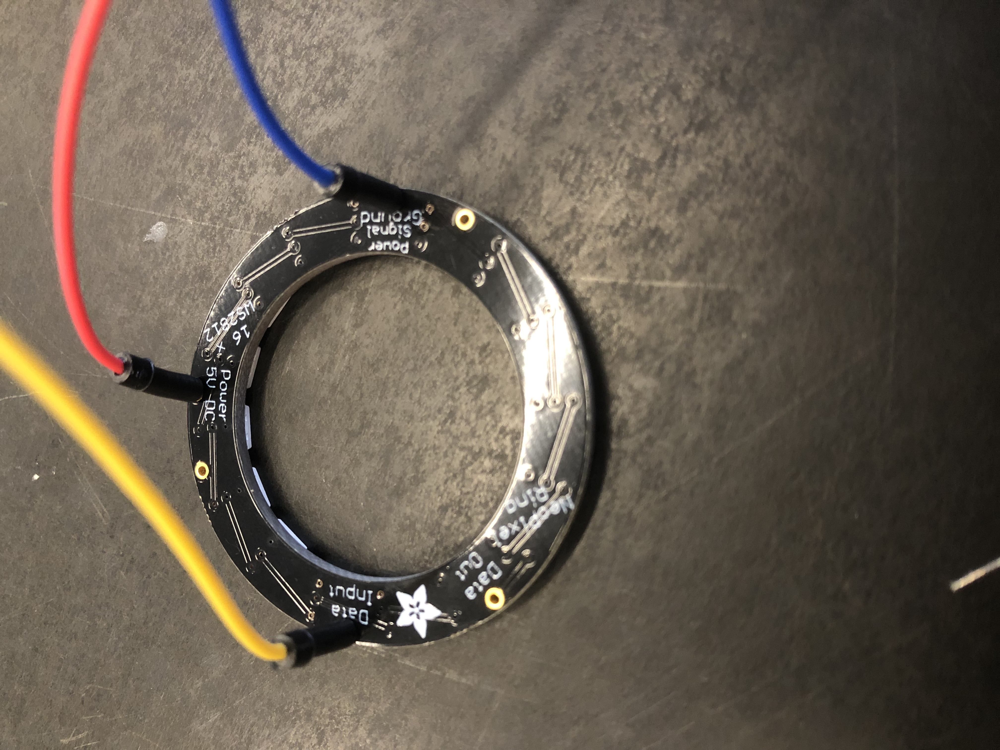 </td>
</tr></table>

## Programming

### Set Up Coding Environment

If you have a new raspberry pi pico, you will have to install Micropython and download the Thonny IDE to program your board.

See instructions on the raspberry pi website __[here](https://projects.raspberrypi.org/en/projects/getting-started-with-the-pico/2)__

### Code

First, we import the necessary libraries:

In [ ]:
from machine import Pin
from neopixel import NeoPixel
import array, time

#### I/O Pin & Variable Definitions

This chunk of code defines the pins each button is connected to and sets them as inputs:

In [ ]:
# Button Pin definitions
button_o = Pin(2, Pin.IN, Pin.PULL_UP)
button_y = Pin(3, Pin.IN, Pin.PULL_UP)
button_g = Pin(4, Pin.IN, Pin.PULL_UP)

This is used to setup the Neopixel Ring: 

In [ ]:
strip_pin = Pin(15, Pin.OUT)
num_pixels = 24
strip = NeoPixel(strip_pin, num_pixels)

#### Function Definitions

This function will check whether or not a button is pressed. The button that is checked is chosen in the function argument.

In [ ]:
def get_button(button):
    status = not button.value()
    time.sleep(.1)
    return status

This function will cause the entire ring to light up in red 

In [ ]:
def toggle_lights():
    color = (100,0,0) #red
    strip.fill(color)
    strip.write()        

This function causes a yellow light to travel through each neopixel all across the ring

In [ ]:
def LED_chase():
    color = (100,100,0) # yellow
    for i in range(0, num_pixels):
        strip.fill((0,0,0))
        strip[i] = color
        strip.write()
        time.sleep(0.1)

This function will fill the ring, one pixel at a time with the selected color, in this case it's green.

In [ ]:
def wheel_fill(wait):
    green = (0,100,0) # green
    for i in range(0, num_pixels):
        strip[i] = green
        strip.write()
        time.sleep(0.1)

#### Infinite Loop

Here is where it all comes together. 

This part of the code runs infinitely. It use the button status function to check if a button is pressed or not. If a button is pressed, it will initiate the function corresponding to that button. If no button is pressed, all the neopixels on the ring will be set to off

In [ ]:
##########          INFINITE LOOP          ##########
while True:
    if get_button(button_o) == 1:
        toggle_lights()
    elif get_button(button_y) == 1:
        LED_chase()
    elif get_button(button_g) == 1:
        wheel_fill(0.2)
    else:
        color = (0, 0, 0)
        strip.fill(color)
        strip.write()
        print("Push a button!")

#### Copy of Entire Program 

In [ ]:
from machine import Pin
from neopixel import NeoPixel
import array, time



##########          SET UP I/O Pins & Variables          ##########
# Button Pin definitions
button_o = Pin(2, Pin.IN, Pin.PULL_UP)
button_y = Pin(3, Pin.IN, Pin.PULL_UP)
button_g = Pin(4, Pin.IN, Pin.PULL_UP)


# setup for neopixel ring
strip_pin = Pin(15, Pin.OUT)
num_pixels = 24
strip = NeoPixel(strip_pin, num_pixels)




##########          FUNCTION DEFINITIONS          ##########

# Checks button status
def get_button(button):
    status = not button.value()
    time.sleep(.1)
    return status

# Ring displays color 
def toggle_lights():
    red = (100,0,0)
    strip.fill(red)
    strip.write()

# Light goes around the ring
def LED_chase():
    yellow = (100,100,0)
    for i in range(0, num_pixels):
        strip.fill((0,0,0))
        strip[i] = yellow
        strip.write()
        time.sleep(0.1)
        
# Light fills the ring one LED at a time
def wheel_fill(wait):
    green = (0,100,0) 
    for i in range(0, num_pixels):
        strip[i] = green
        strip.write()
        time.sleep(0.1)




##########          INFINITE LOOP          ##########
while True:
    if get_button(button_o) == 1:
        toggle_lights()
    elif get_button(button_y) == 1:
        LED_chase()
    elif get_button(button_g) == 1:
        wheel_fill(0.2)
    else:
        off = (0, 0, 0)
        strip.fill(off)
        strip.write()
        print("Push a button!")